# Lab 2: Clustering

The goal of this lab session is to code a clustering algorithm, apply it to data and compare the performance with other techniques.

We begin with the standard imports:

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.cluster as cluster # all clustering techniques except hdbscan
%matplotlib inline
sns.set_context('poster')
sns.set_color_codes()
plot_kwds = {'alpha' : 0.25, 's' : 80, 'linewidths':0}

We will have two toy datasets to try the different methods:

There are a lot of clustering algorithms to choose from the `sklearn` library. So what clustering algorithms should you be using? It depends.

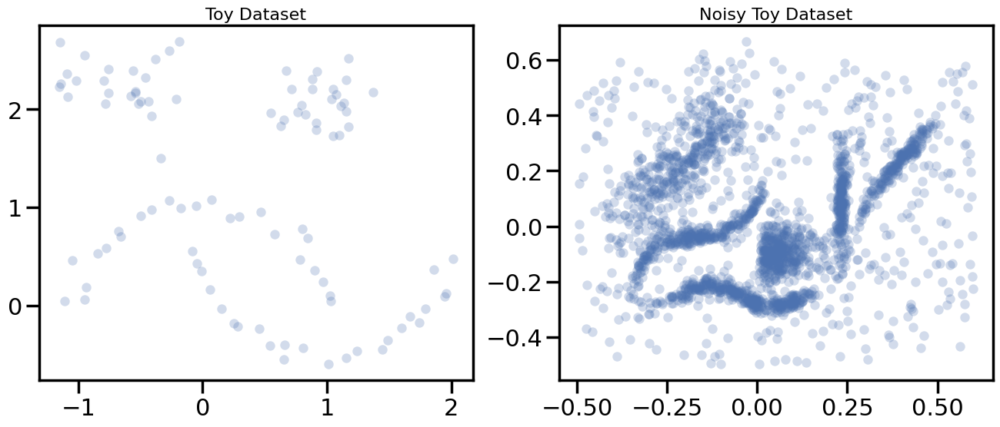

In [2]:
import sklearn.datasets as data
moons, _ = data.make_moons(n_samples=50, noise=0.05)
blobs, _ = data.make_blobs(n_samples=50, centers=[(-0.75,2.25), (1.0, 2.0)], cluster_std=0.25)
test_data_0 = np.vstack([moons, blobs])

test_data_1 = np.load('clusterable_data.npy')

fig, ax = plt.subplots(1, 2, figsize=(16, 6))
ax[0].scatter(test_data_0.T[0], test_data_0.T[1], c='b', **plot_kwds)
ax[0].set_title('Toy Dataset', size=16)

ax[1].scatter(test_data_1.T[0], test_data_1.T[1], color='b', **plot_kwds)
ax[1].set_title('Noisy Toy Dataset', size=16)

plt.show();

In [3]:
test_data_1.shape

(2309, 2)

## K-means

K-Means is the 'go-to' clustering algorithm for many simply because it is fast, easy to understand, and available everywhere (there's an implementation in almost any statistical or machine learning tool you care to use). However, K-Means has a few problems caused by its simplicity. 

We try the `sklearn` implementation in our toy datasets:

## Aglomerative Single Linkage clustering

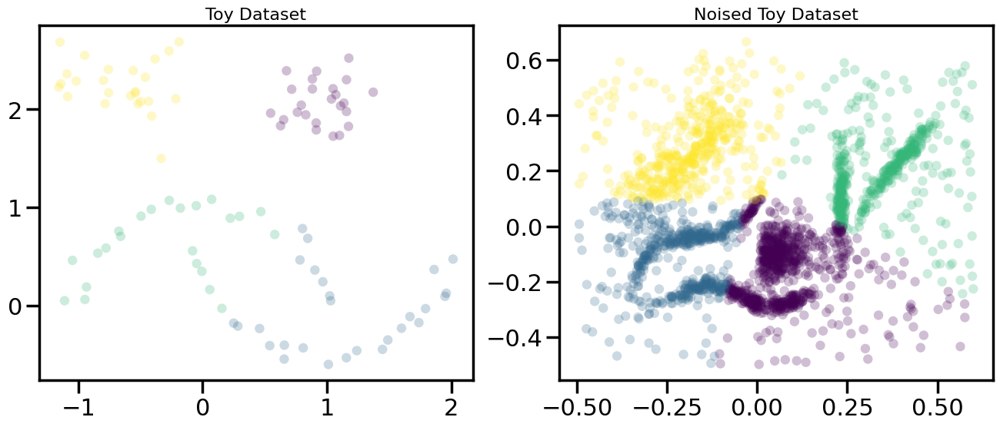

In [4]:
from sklearn.cluster import KMeans
kmeans_0 = KMeans(n_clusters=4, max_iter=200).fit(test_data_0)
kmeans_1 = KMeans(n_clusters=4, max_iter=200).fit(test_data_1)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))
ax[0].scatter(test_data_0.T[0], test_data_0.T[1], c=kmeans_0.labels_ , **plot_kwds)
ax[0].set_title('Toy Dataset', size=16)

ax[1].scatter(test_data_1.T[0], test_data_1.T[1], c=kmeans_1.labels_, **plot_kwds)
ax[1].set_title('Noised Toy Dataset', size=16)


plt.show();

Agglomerative clustering is a suite of algorithms all based on the same idea. The fundamental idea is that you start with each point in it's own cluster and then, for each cluster, use some criterion to choose another cluster to merge with. Do this repeatedly until you have only one cluster and you get get a hierarchy, or binary tree, of clusters branching down to the last layer which has a leaf for each point in the dataset. The most basic version of this, single linkage, chooses the closest cluster to merge, and hence the tree can be ranked by distance as to when clusters merged/split.

**Code your own Aglomerative Single Linkage clustering algorithm**!:

- Fill in the class 
- During the process, keep track of the cluster merges by saving a (num_samples-1,4) np.array being a linkage matrix in scypy format (to use their function to plot dendrogram: `scipy.cluster.hierarchy.dendrogram`). check documentation.

In [5]:
from scipy.spatial import distance 
from scipy.cluster.hierarchy import dendrogram
from tqdm import tqdm
from torch import argmin

In [20]:
from hashlib import new


class my_SingleLinkageAglomerativeClustering():
    
    def __init__(self, metric="euclidean", n_clusters=3):
        '''
        Attributes:
        
        metric_: {"euclidean","precomputed"}
            the distance to be used
            if precomputed then X is distance matrix
        n_clusters: integer
            number of clusters to return 
        linkage_matrix_: (n-1, 4) np.array # distances entre clusters , nb de pts par clusters, nb de clusters, ?
            in the same format as linkage  
        labels_: integer np.array
            label assigment
        hierarchy_: list of np.array
            each array corresponds to label assigment
            at each level (number of clusters)
            hierarchy_[0]=np.array(list(range(n)))
        '''
        self.metric_ = metric
        self.n_clusters_ = n_clusters
        self.linkage_matrix_ = None
        self.labels_ = None
        self.hierarchy_ = None
        
    def fit(self, X):
        """ Create a hierarchy of clusters
        
        Parameters:
        -----------
        X: (n, p) np.array
            Data matrix
        
        Returns:
        -----
        self: my_SingleLinkageAglomerativeClustering
            to have access to labels_
        """
        n,p=X.shape
        self.linkage_matrix_ = np.zeros((n-1,4))
        self.hierarchy_ = [list(range(n))]
        # if it's not precomputed compute the distance matrix
        distances=np.array([[distance.euclidean(X[i],X[j]) for i in range(n)] for j in range(n)])
        for i in range(distances.shape[0]):
            distances[i,i] = np.inf #Remove zeros from the diagonal 
        # using from scipy.spatial import distance
        for step in tqdm(range(n-1)): 
            arg_min=np.unravel_index(distances.argmin(),(n,n))
            pmax=max(arg_min)
            pmin=min(arg_min)
            min_d=distances[arg_min]
            for k in range(n):
                if k==pmin:
                    distances[pmax,k]=np.inf
                    distances[k,pmax]=np.inf
                    continue
                else:
                    distances[pmin,k]=min(distances[pmin,k],distances[pmax,k])
                    distances[k,pmin]=distances[pmin,k] # to have symetry on matrix
                    distances[pmax,k]=np.inf
                    distances[k,pmax]=np.inf
            new_hiear=self.hierarchy_[-1].copy()
            count=0
            for i in range(n):
                if new_hiear[i]==self.hierarchy_[-1][pmin] or new_hiear[i]==self.hierarchy_[-1][pmax]:
                    new_hiear[i]=n+step
                    count+=1

            self.linkage_matrix_[step][0]=self.hierarchy_[-1][pmin] 
            self.linkage_matrix_[step][1]=self.hierarchy_[-1][pmax]
            self.linkage_matrix_[step][2]=min_d
            self.linkage_matrix_[step][3]=count
            self.hierarchy_.append(new_hiear)
    def labels(self,i):
        # return the labels of classes corresponding to the iter i (depth i)
        h=np.array(self.hierarchy_[i])
        d={}
        for x in h:
            d[x]=1+d.get(x,0)
        d2={}
        i=1
        for k in d.keys():
            d2[k]=i
            i+=1
        #
        for i in range(len(h)):
            h[i]=d2[h[i]]
        return h
        # HINT:
        # You can use a minimum spanning tree and add merge in increasing order
        # or modifying the distance matrix 
        # (add row/column for new clusters and remove/put zero in old row/colums)
        
        # keep track of merges in linkage_matrix_ and labels in hierarchy_
        
        # update labels_ from the hierarchy level selected by n_clusters_ 
        
    def plot_dendrogram(self):
        '''Use self.linkage_matrix_ in `scipy.cluster.hierarchy.dendrogram` 
        to plot the dendrogram of the hierarchical structure
        '''
        dendrogram(self.linkage_matrix_)
        plt.show()   

In [21]:
# test sur un petit echantillon 
model=my_SingleLinkageAglomerativeClustering()
model.fit(test_data_1[:6,:])

100%|██████████| 5/5 [00:00<?, ?it/s]


In [22]:
model.linkage_matrix_

array([[3.        , 4.        , 0.01974905, 2.        ],
       [0.        , 6.        , 0.04349327, 3.        ],
       [7.        , 1.        , 0.05767164, 4.        ],
       [8.        , 5.        , 0.09390674, 5.        ],
       [9.        , 2.        , 0.15867114, 6.        ]])

In [23]:
model.hierarchy_

[[0, 1, 2, 3, 4, 5],
 [0, 1, 2, 6, 6, 5],
 [7, 1, 2, 7, 7, 5],
 [8, 8, 2, 8, 8, 5],
 [9, 9, 2, 9, 9, 9],
 [10, 10, 10, 10, 10, 10]]

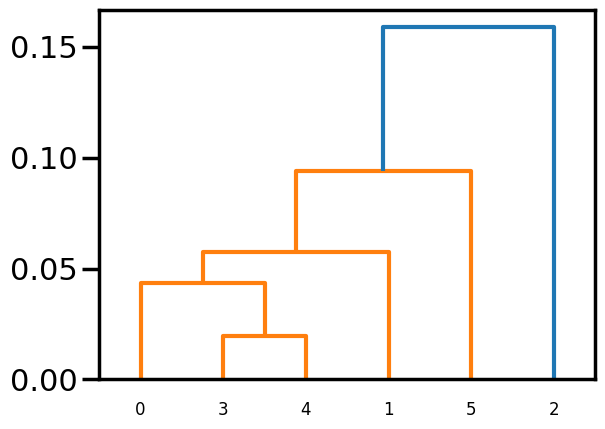

In [24]:
model.plot_dendrogram()

Apply the method to our toy datasets

100%|██████████| 99/99 [00:00<00:00, 7091.99it/s]


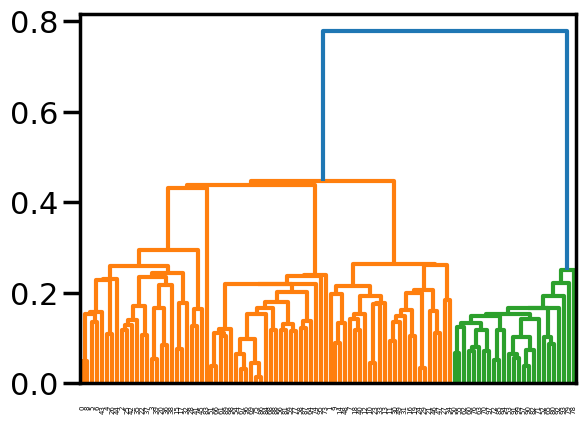

In [25]:
from scipy.spatial import distance 
from scipy.cluster.hierarchy import dendrogram

# TODO
model.fit(test_data_0)
model.plot_dendrogram()

## Min distance evry iteration on dataset 0

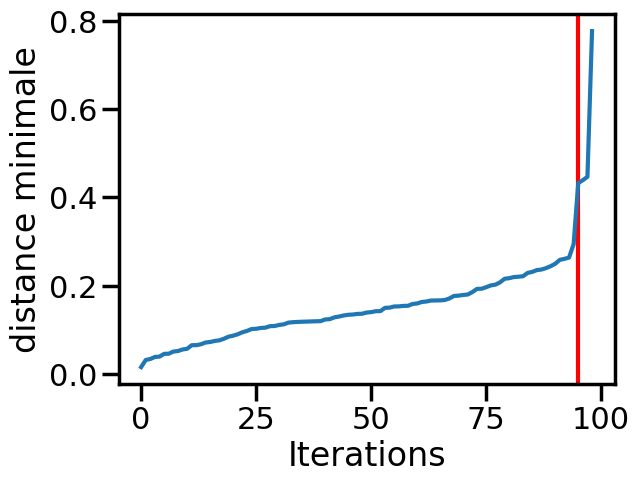

In [26]:
distances=model.linkage_matrix_[:,-2]
plt.xlabel("Iterations")
plt.ylabel("distance minimale")
plt.axvline(x=95,color="red")
plt.plot(distances)

100%|██████████| 2308/2308 [00:15<00:00, 149.41it/s]


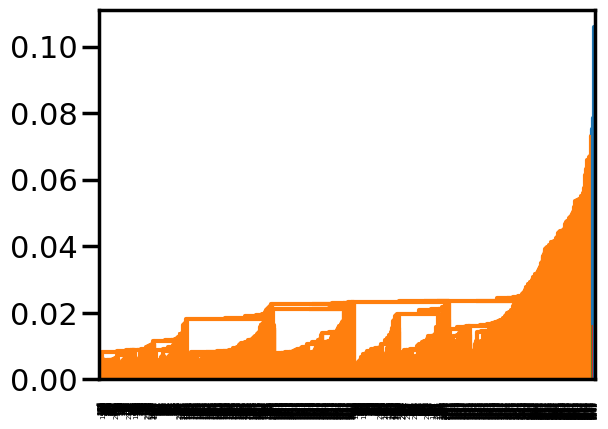

In [27]:
model2=my_SingleLinkageAglomerativeClustering()
model2.fit(test_data_1)
model2.plot_dendrogram()

## Min distance evry iteration on noised dataset

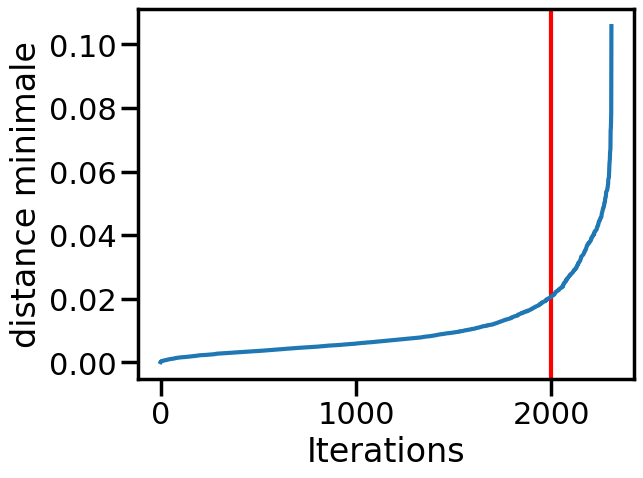

In [28]:

distances=model2.linkage_matrix_[:,-2]
plt.xlabel("Iterations")
plt.ylabel("distance minimale")
plt.axvline(x=2000,color="red")
plt.plot(distances)

No handles with labels found to put in legend.


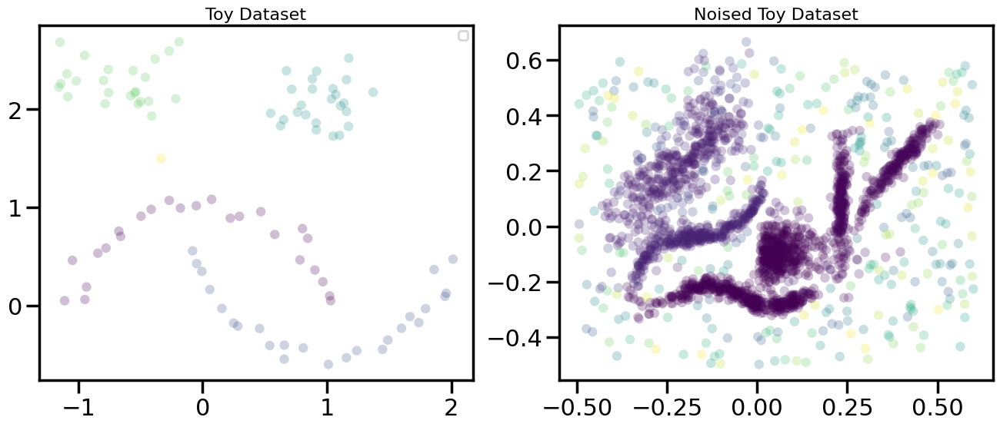

In [30]:
h=model.labels(95)

h2=model2.labels(2000)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))
ax[0].scatter(test_data_0.T[0], test_data_0.T[1], c=h , **plot_kwds)
ax[0].set_title('Toy Dataset', size=16)
ax[1].scatter(test_data_1.T[0], test_data_1.T[1], c=h2, **plot_kwds)
ax[1].set_title('Noised Toy Dataset', size=16)

ax[0].legend(fontsize=10)
plt.show()

Try the different linkage methods implemented in `sklearn`  and comment

No handles with labels found to put in legend.


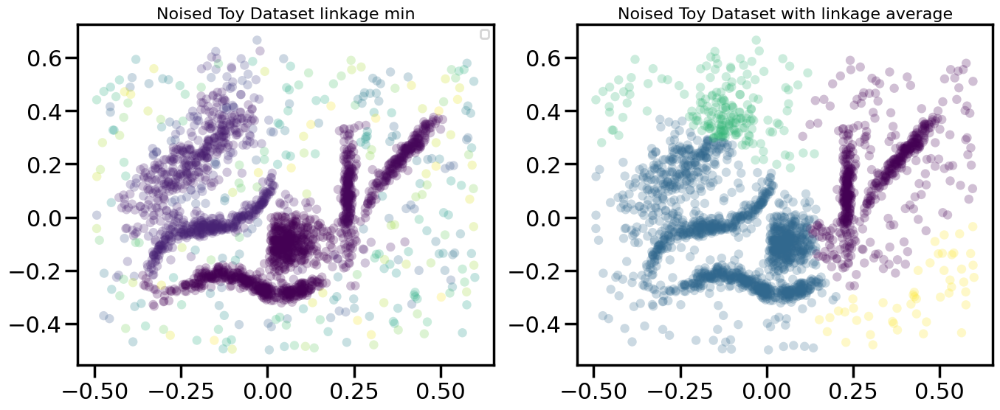

In [41]:
# TODO
from sklearn.cluster import AgglomerativeClustering
clustering = AgglomerativeClustering(n_clusters=4,linkage="average").fit(test_data_1)
fig, ax = plt.subplots(1, 2, figsize=(16, 6))
ax[0].scatter(test_data_1.T[0], test_data_1.T[1], c=h2, **plot_kwds)
ax[0].set_title('Noised Toy Dataset linkage min', size=16)
ax[1].scatter(test_data_1.T[0], test_data_1.T[1], c=clustering.labels_, **plot_kwds)
ax[1].set_title('Noised Toy Dataset with linkage average', size=16)

ax[0].legend(fontsize=10)
plt.show()

No handles with labels found to put in legend.


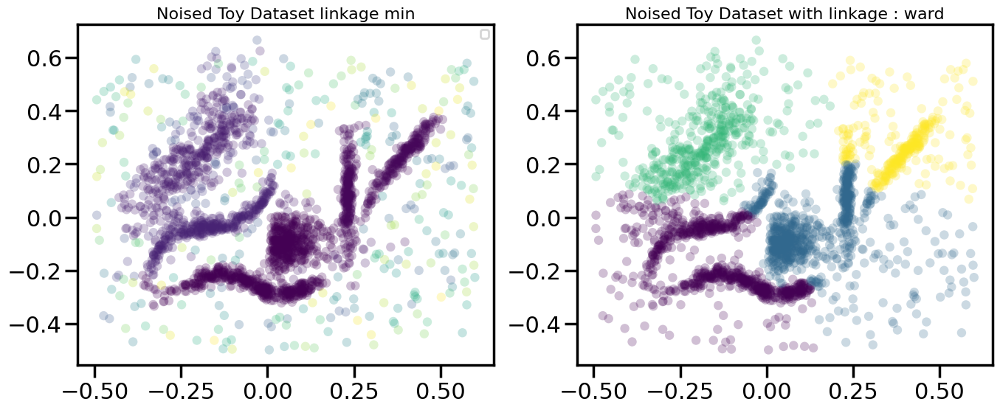

In [42]:
clustering = AgglomerativeClustering(n_clusters=4,linkage="ward").fit(test_data_1)
fig, ax = plt.subplots(1, 2, figsize=(16, 6))
ax[0].scatter(test_data_1.T[0], test_data_1.T[1], c=h2, **plot_kwds)
ax[0].set_title('Noised Toy Dataset linkage min', size=16)
ax[1].scatter(test_data_1.T[0], test_data_1.T[1], c=clustering.labels_, **plot_kwds)
ax[1].set_title('Noised Toy Dataset with linkage : ward', size=16)

ax[0].legend(fontsize=10)
plt.show()

No handles with labels found to put in legend.


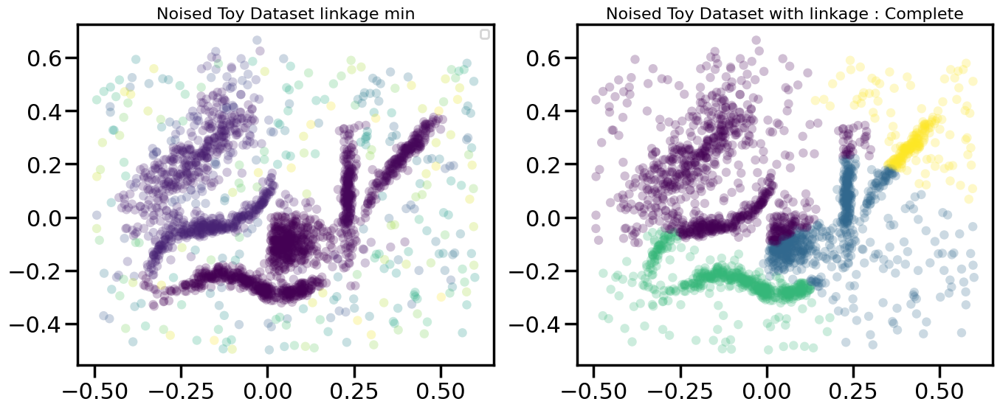

In [43]:
clustering = AgglomerativeClustering(n_clusters=4,linkage="complete").fit(test_data_1)
fig, ax = plt.subplots(1, 2, figsize=(16, 6))
ax[0].scatter(test_data_1.T[0], test_data_1.T[1], c=h2, **plot_kwds)
ax[0].set_title('Noised Toy Dataset linkage min', size=16)
ax[1].scatter(test_data_1.T[0], test_data_1.T[1], c=clustering.labels_, **plot_kwds)
ax[1].set_title('Noised Toy Dataset with linkage : Complete', size=16)

ax[0].legend(fontsize=10)
plt.show()

In [347]:
test_data_1.shape

(2309, 2)

## DBSCAN

DBSCAN is a density based algorithm -- it assumes clusters for dense regions. It is also the first actual clustering algorithm we've looked at: it doesn't require that every point be assigned to a cluster and hence doesn't partition the data, but instead extracts the 'dense' clusters and leaves sparse background classified as 'noise'. In practice DBSCAN is related to agglomerative clustering. As a first step DBSCAN transforms the space according to the density of the data: points in dense regions are left alone, while points in sparse regions are moved further away. Applying single linkage clustering to the transformed space results in a dendrogram, which we cut according to a distance parameter (called epsilon or `eps` in many implementations) to get clusters. Importantly any singleton clusters at that cut level are deemed to be 'noise' and left unclustered. 

Apply it to the test_data, how do you tune the parameters?

No handles with labels found to put in legend.


[0, 1, 2, -1]


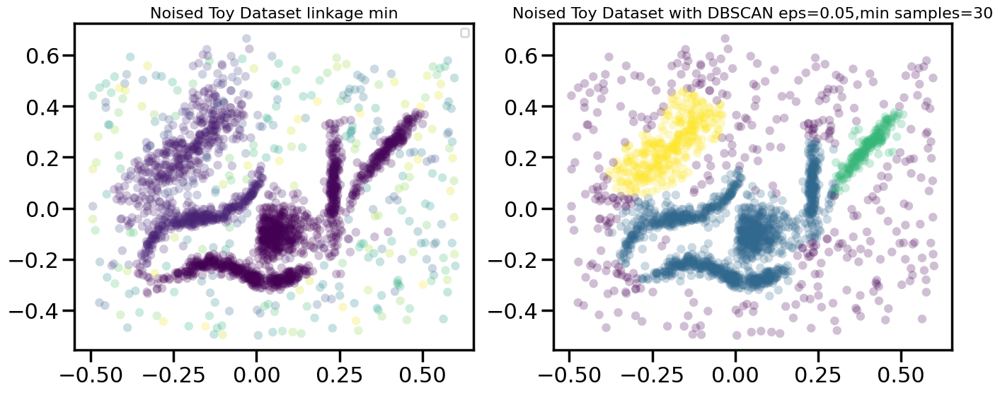

In [33]:
# TODO
from sklearn.cluster import DBSCAN
clustering = DBSCAN(eps=0.05, min_samples=30).fit(test_data_1)
fig, ax = plt.subplots(1, 2, figsize=(16, 6))
ax[0].scatter(test_data_1.T[0], test_data_1.T[1], c=h2, **plot_kwds)
ax[0].set_title('Noised Toy Dataset linkage min', size=16)
ax[1].scatter(test_data_1.T[0], test_data_1.T[1], c=clustering.labels_, **plot_kwds)
ax[1].set_title('Noised Toy Dataset with DBSCAN eps=0.05,min samples=30', size=16)

ax[0].legend(fontsize=10)
print(list(set(clustering.labels_)))
plt.show()

No handles with labels found to put in legend.


[0, 1, 2, 3, 4, 5, -1]


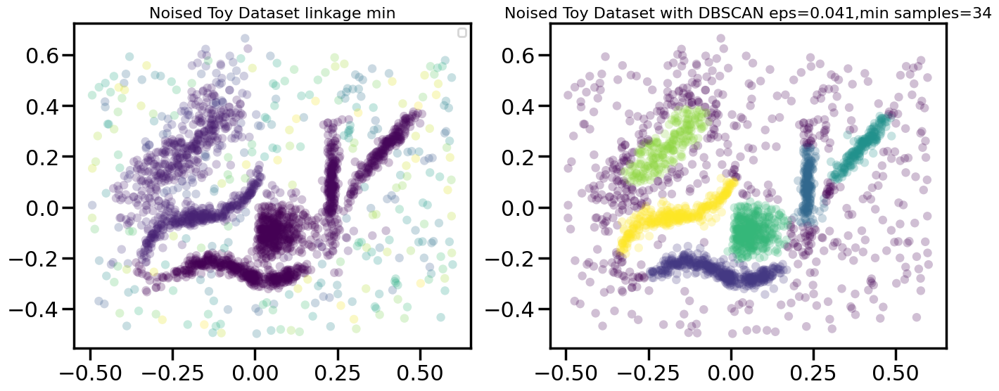

In [37]:
# TODO
clustering = DBSCAN(eps=0.041, min_samples=34).fit(test_data_1) # best one that i have found
fig, ax = plt.subplots(1, 2, figsize=(16, 6))
ax[0].scatter(test_data_1.T[0], test_data_1.T[1], c=h2, **plot_kwds)
ax[0].set_title('Noised Toy Dataset linkage min', size=16)
ax[1].scatter(test_data_1.T[0], test_data_1.T[1], c=clustering.labels_, **plot_kwds)
ax[1].set_title('Noised Toy Dataset with DBSCAN eps=0.041,min samples=34', size=16)

ax[0].legend(fontsize=10)
print(list(set(clustering.labels_)))
plt.show()

## HDBSCAN

HDBSCAN is a recent algorithm developed by some of the same people who write the original DBSCAN paper. Their goal was to allow varying density clusters. The algorithm starts off much the same as DBSCAN: we transform the space according to density, exactly as DBSCAN does, and perform single linkage clustering on the transformed space. Instead of taking an epsilon value as a cut level for the dendrogram however, a different approach is taken: the dendrogram is condensed by viewing splits that result in a small number of points splitting off as points 'falling out of a cluster'. This results in a smaller tree with fewer clusters that 'lose points'. That tree can then be used to select the most stable or persistent clusters. This process allows the tree to be cut at varying height, picking our varying density clusters based on cluster stability.

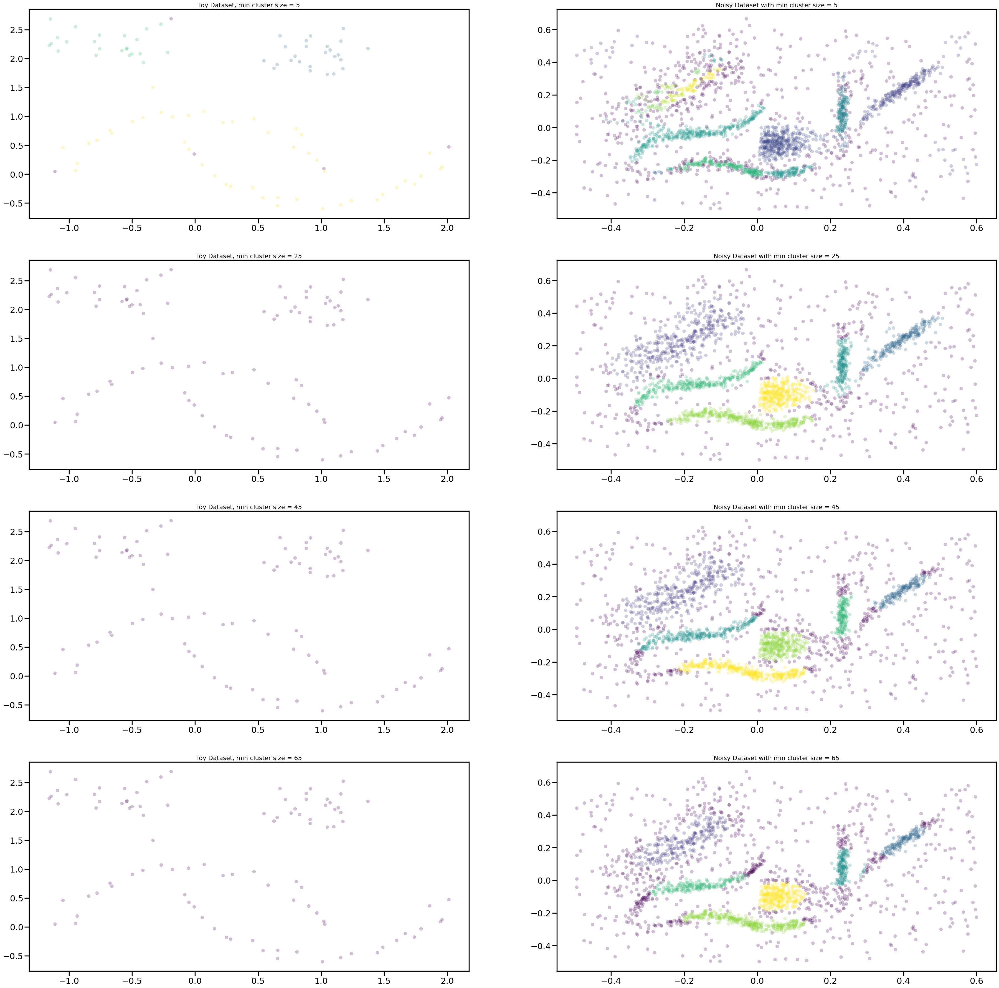

In [60]:
import hdbscan
from hdbscan import HDBSCAN
# TODO
clusterer = hdbscan.HDBSCAN(min_cluster_size=5, gen_min_span_tree=True)
clusterer.fit(test_data_1)
n_cluster_size = range(5,66,20)

fig,axes = plt.subplots(len(n_cluster_size), 2, figsize = (45,45))
for i,s in enumerate(n_cluster_size):

    hdbs1 = hdbscan.HDBSCAN(algorithm= 'best', min_cluster_size=int(s)).fit(test_data_0)
    hdbs2 = hdbscan.HDBSCAN(algorithm= 'best', min_cluster_size=int(s)).fit(test_data_1)

    axes[i,0].scatter(test_data_0.T[0], test_data_0.T[1], c=hdbs1.labels_, **plot_kwds)
    axes[i,0].set_title(f'Toy Dataset, min cluster size = {s}', size=16)

    axes[i,1].scatter(test_data_1.T[0], test_data_1.T[1], c=hdbs2.labels_, **plot_kwds)
    axes[i,1].set_title(f'Noisy Dataset with min cluster size = {s}', size=16)

plt.show()

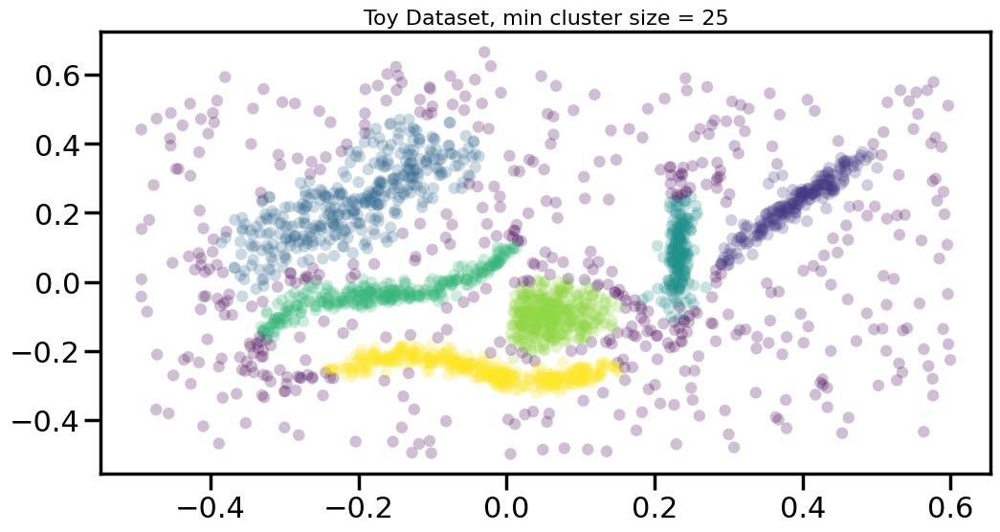

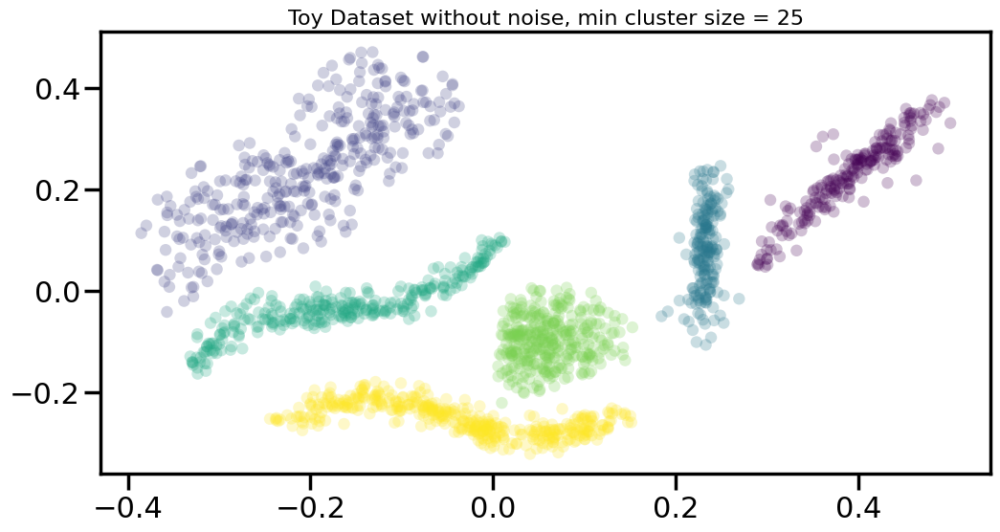

In [68]:
# only here we set min_span_tree to True so we don't compute it in the loop before

#NOISY DATASET
hdbs3 = HDBSCAN(
    min_cluster_size=26,
    approx_min_span_tree=True,
    gen_min_span_tree=True
    ).fit(test_data_1)

fig, ax = plt.subplots(1,1, figsize = (12,6))
ax.scatter(test_data_1.T[0], test_data_1.T[1], c=hdbs3.labels_, **plot_kwds)
ax.set_title(f'Toy Dataset, min cluster size = {25}', size=16)
plt.show()

test_data_1_without_outl = test_data_1[np.argwhere(np.array(hdbs3.labels_ != -1))] # we remove outliers
labels_clean= hdbs3.labels_[np.argwhere(np.array(hdbs3.labels_ != -1))]

fig, ax = plt.subplots(1,1, figsize = (12,6))

ax.scatter(test_data_1_without_outl.T[0], test_data_1_without_outl.T[1], c=labels_clean, **plot_kwds)
ax.set_title(f'Toy Dataset without noise, min cluster size = {25}', size=16)
plt.show()

<AxesSubplot:>

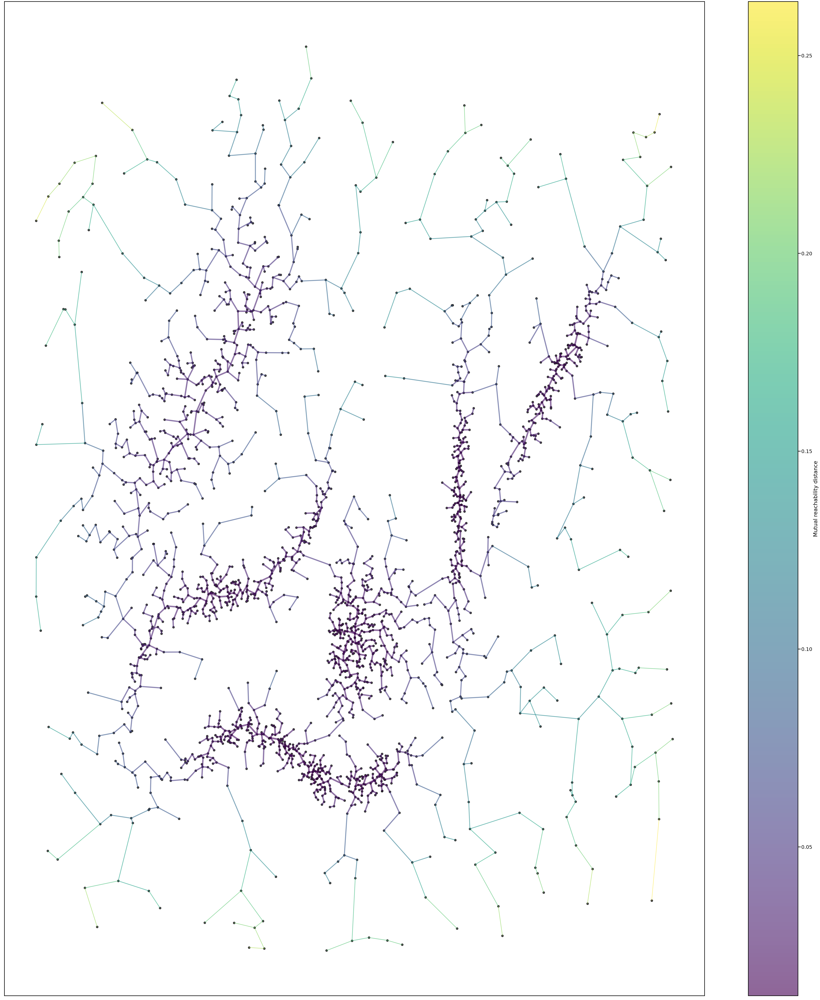

In [74]:
# minimum span Tree
fig = plt.figure(figsize=(70,80))
hdbs3.minimum_spanning_tree_.plot(edge_cmap='viridis',
                                      edge_alpha=0.6,
                                      node_size=80,
                                      edge_linewidth=2)

<AxesSubplot:ylabel='$\\lambda$ value'>

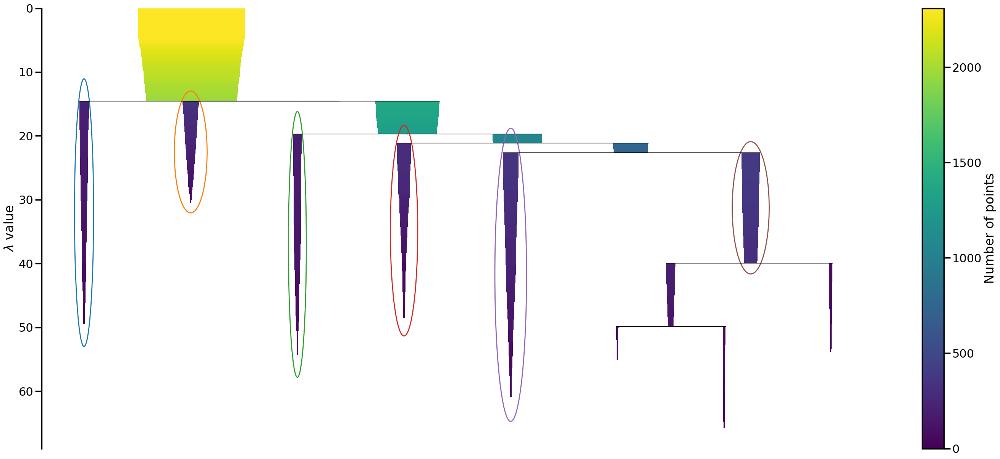

In [79]:
fig = plt.figure(figsize=(35,15))
hdbs3.condensed_tree_.plot(select_clusters=True, selection_palette=sns.color_palette())

## Apply the algorithms to the following images and comment the results

### NASA Curiosity Picture

- Look at following NASA photo taken by a robot in mars:


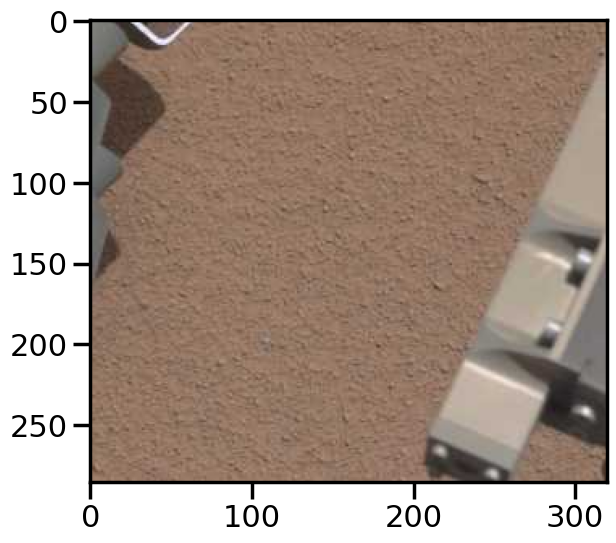

In [75]:
from PIL import Image

Im_1  = Image.open('im_nasa_reduced.jpg')

fig = plt.figure(figsize=(8, 6))
plt.imshow(Im_1)
plt.show()

- Transform the image to an intensity (I) and saturation (S) representation, it helps to distinguish bright and textures.

$$I=\frac{R+G+B}{3}$$
$$S=1-I\times min(R, G, B)$$

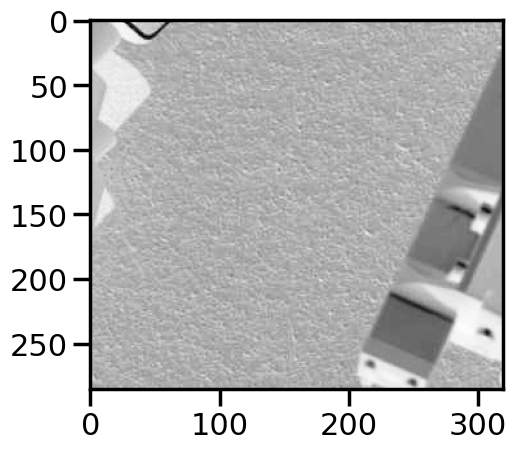

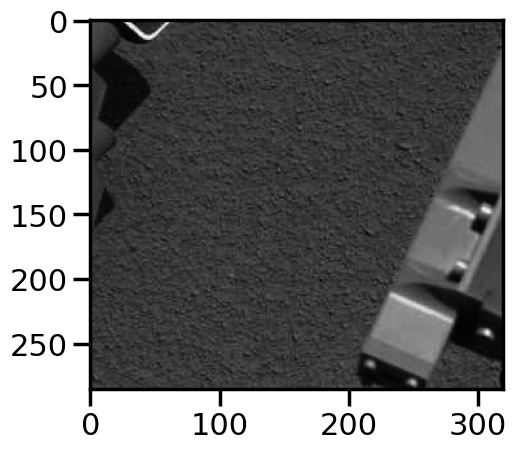

In [86]:
# TODO:
im1=np.array(Im_1)
I = np.sum(im1,axis=2)/3
S = 1-I*np.min(im1,axis=2)
plt.imshow(I, cmap='Greys')
plt.show()
plt.imshow(S, cmap='Greys')
plt.show()

- Apply the seen algorithms to segment the image in the Intensity-Saturation representation, comment the results and check if you find something on mars' surface. Be careful with hdbscan and memory errors for some parameters choice (use algorithm='boruvka_kdtree').

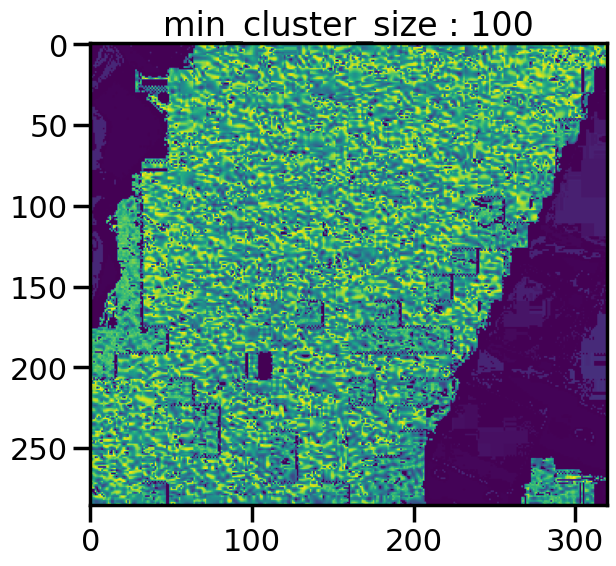

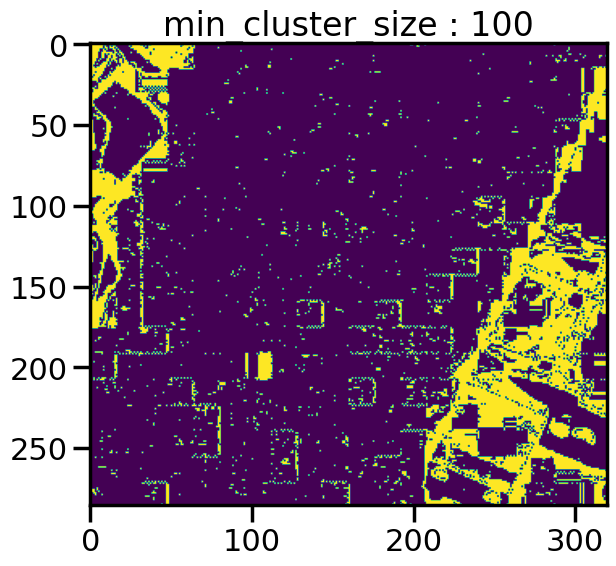

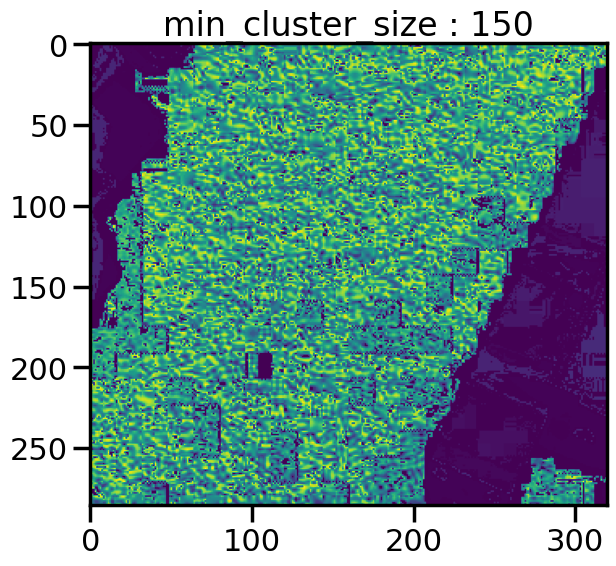

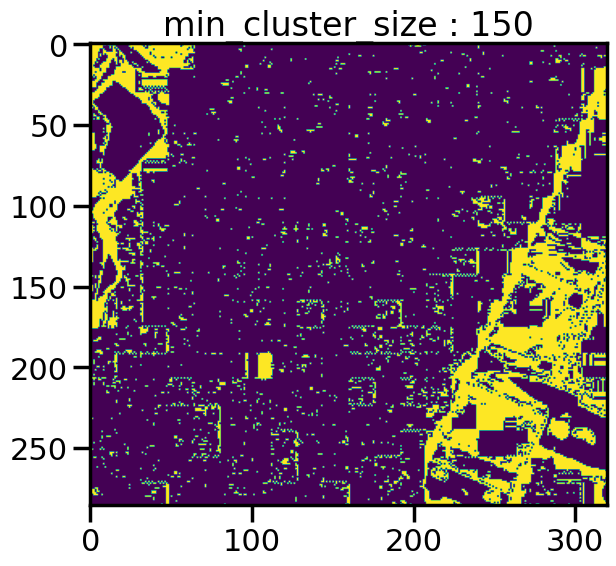

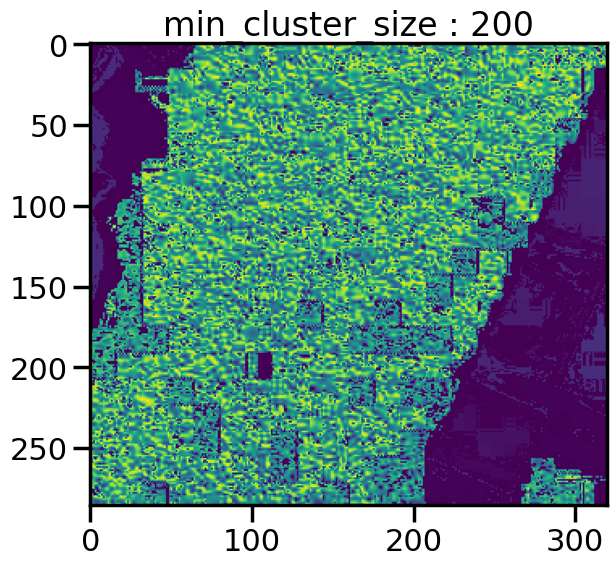

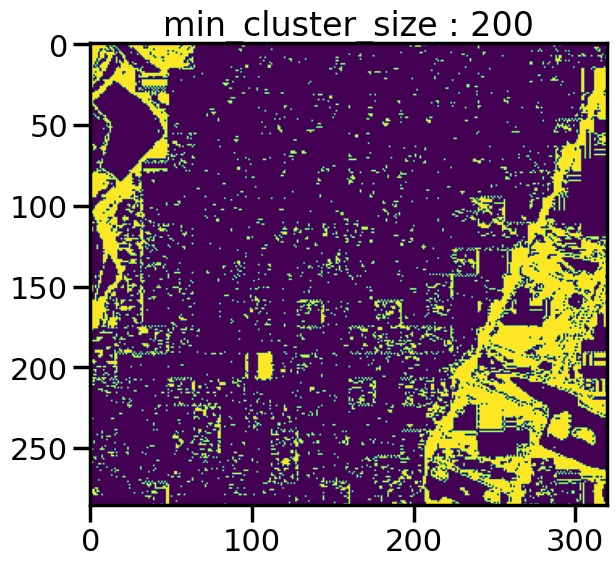

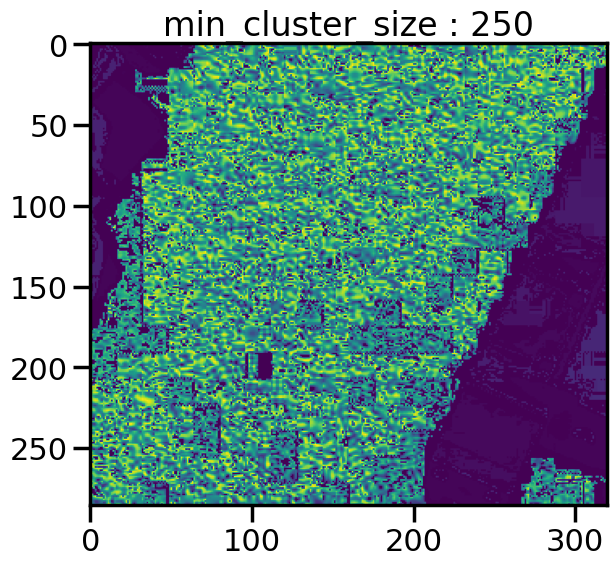

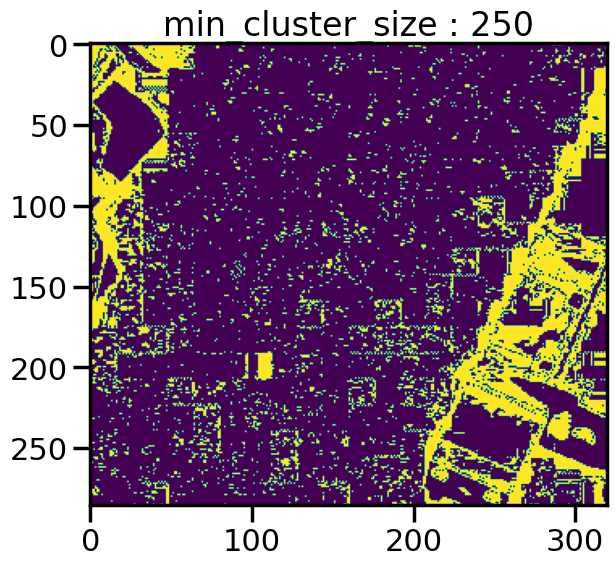

In [90]:
# TODO
im1=np.array(Im_1)
I = (np.sum(im1,axis=2)/3)/255
S = (1-I*np.min(im1,axis=2))/255
X = np.concatenate([I.reshape(-1,1), S.reshape(-1,1)], axis = 1)
for min_cluster_size in range(100,300,50):

    min_cluster_size = int(min_cluster_size)
    hdbs = HDBSCAN(algorithm='boruvka_kdtree', min_cluster_size=min_cluster_size).fit(X)

    n,m = I.shape
    fig,ax = plt.subplots(1,1,figsize=(12,6))
    ax.imshow(np.array(hdbs.labels_).reshape((n, m)), cmap = "viridis")
    ax.set_title(f"min_cluster_size : {min_cluster_size}")
    plt.show()
    fig,ax = plt.subplots(1,1,figsize=(12,6))
    ax.imshow((np.array(hdbs.labels_) == -1).reshape((n, m)), cmap = "viridis")
    ax.set_title(f"min_cluster_size : {min_cluster_size}")
    plt.show()

### Color compression

One interesting application of clustering is in color compression within images. 
For example, imagine you have an image with millions of colors.
In most images, a large number of the colors will be unused, and many of the pixels in the image will have similar or even identical colors.

Get a simplified 10-colored version of the following image by applying k-means. Plot both images.

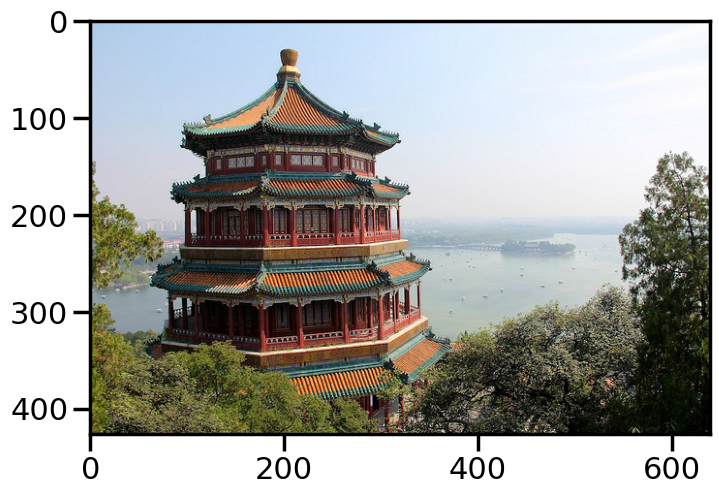

In [39]:
from sklearn.datasets import load_sample_image
china = load_sample_image("china.jpg")

fig = plt.figure(figsize=(8, 6))
plt.imshow(china);

In [ ]:
# TODO